In [1]:
from imports import *

# set columnns display format
pd.set_option('display.max_columns', None)
# default pandas decimal number display format
# pd.options.display.float_format = '{:20,.3f}'.format

# Data Acquisition

In [2]:
# import raw, messy data
df = acquire.get_zillow_data()

In [3]:
df.shape

(52438, 67)

# Data Preparation

### Missing Value Analysis

<AxesSubplot:>

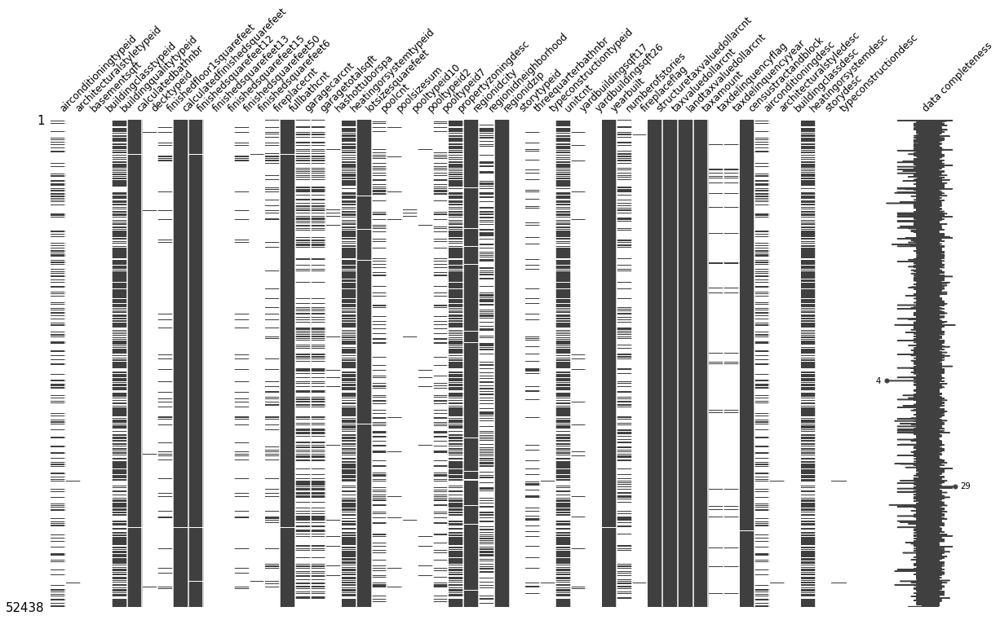

In [5]:
# Visualizing missing values
missingValueColumns = df.columns[df.isnull().any()].tolist()

msno.matrix(df[missingValueColumns], width_ratios = (10, 1), \
           figsize=(20,11), fontsize = 12, sparkline=True, labels = True)

In [4]:
# Cleaned dataframe
df = prepare.prep_zillow(df)

In [5]:
df.shape

(45317, 21)

In [7]:
train, validate, test = prepare.split(df)
train.shape, validate.shape, test.shape

((25377, 21), (10876, 21), (9064, 21))

# EDA

## Question 1: Is log error significantly different across different counties?

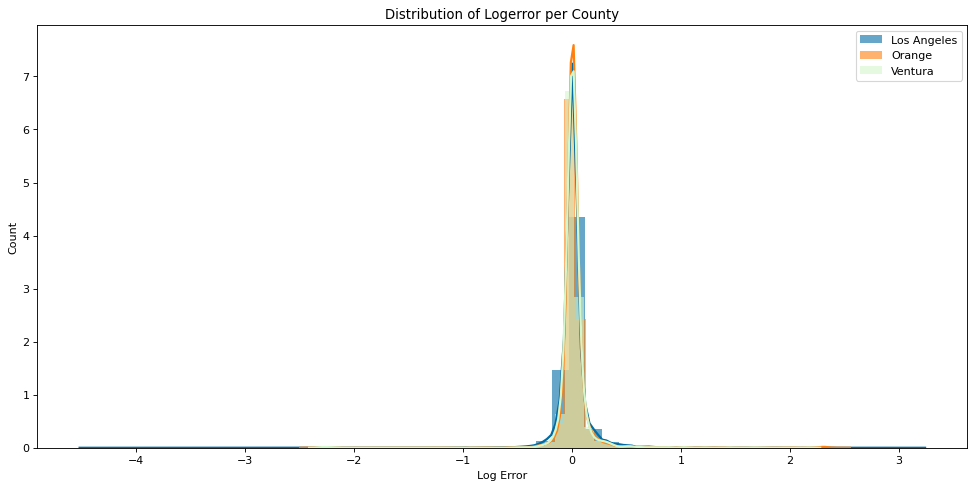

In [8]:
# Visualizing distribution of assessed_value per county

losangeles = train[train['county'] == 'Los Angeles'].logerror
orange = train[train['county'] == 'Orange'].logerror
ventura = train[train['county'] == 'Ventura'].logerror

kwargs = dict(hist_kws={'alpha':.6}, kde_kws={'linewidth':2})
plt.figure(figsize=(15,7), dpi= 80)
sns.distplot(losangeles, color="#006ba4", label="Los Angeles", **kwargs)
sns.distplot(orange, color="#ff800e", label="Orange", **kwargs)
sns.distplot(ventura, color="#D4F6CC", label="Ventura", **kwargs)
plt.xlabel('Log Error')
plt.ylabel('Count')
plt.title('Distribution of Logerror per County')
plt.legend();

<AxesSubplot:xlabel='county', ylabel='logerror'>

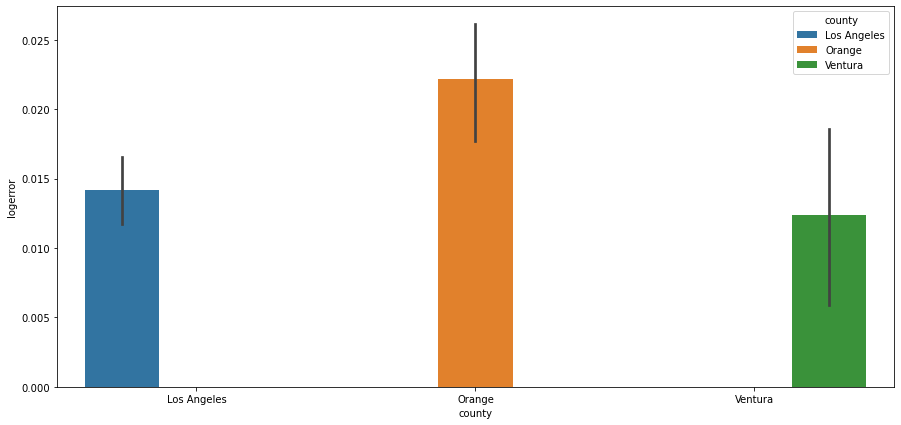

In [9]:
plt.figure(figsize=(15,7))
sns.barplot(x='county', y='logerror',hue = 'county', data = train)

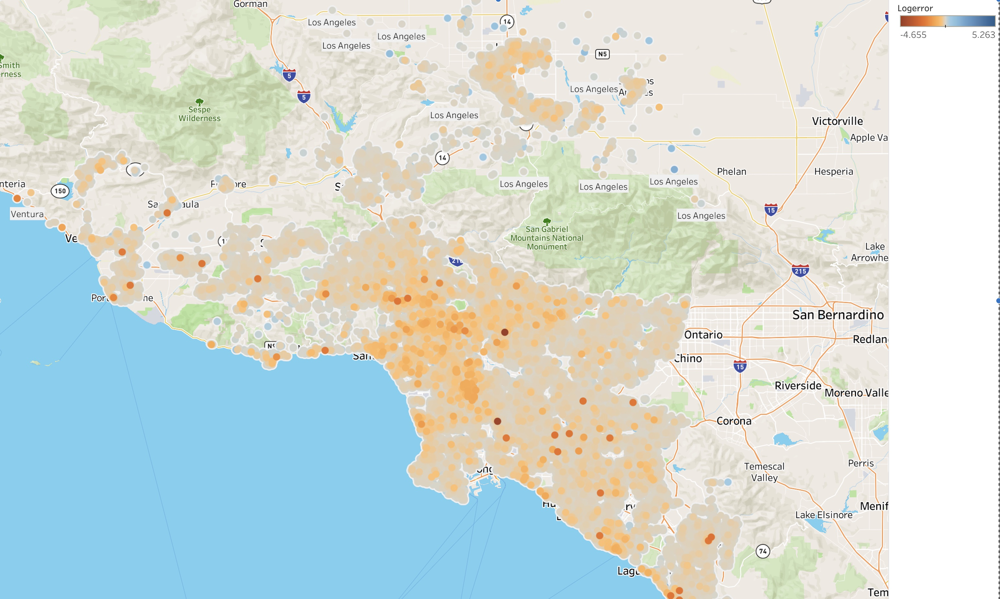

### ANOVA Test
**Set Hypothesis**

$H_{0}$: Logerror of Los Angeles, Orange, and Ventura County are all equal.

$H_{a}$: Logerror of property tax assessed value of Los Angeles, Orange, and Ventura County are not all equal.


**Verify Assumptions**

- Normal: Yes
- Independent: Yes
- Variance: False

In [10]:
# Set alpha
alpha = 0.05

# Comparing mean of 3 independent samples
t, p = stats.f_oneway(losangeles, orange, ventura)
if p < alpha:
    print("We reject H0.")
    print(Fore.BLUE + '\nMean of property tax assessed value of Los Angeles, Orange, and Ventura County are not all equal. ')
else:
    print("We fail to reject H0")

We reject H0.

Mean of property tax assessed value of Los Angeles, Orange, and Ventura County are not all equal. 


## Follw up questions: what about latitude, longitude?

In [35]:
fig = px.scatter(train, x="latitude", y="longitude", color="logerror",color_continuous_scale='gnbu'
                 ,hover_data=['county'],width=900, height=600)
fig.show()

## Question 2: Is there a relationship between log error and the age of the house?

Text(0.5, 1.0, 'Logerror by Age')

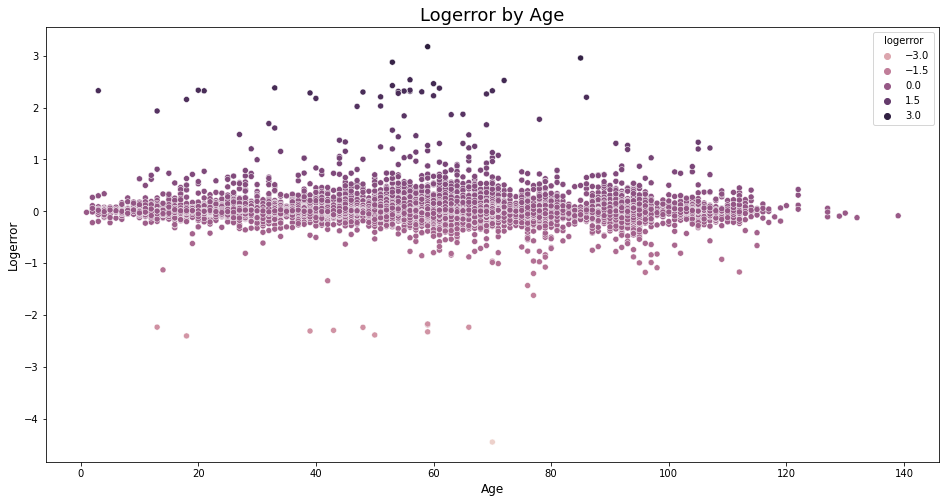

In [37]:
# Visualizing how age of the house is correlated with legerror
plt.figure(figsize = (16,8))
sns.scatterplot(x = train.age, y = train.logerror, color = 'red', data = train, hue=train.logerror)
plt.xlabel('Age', fontsize = 12)
plt.ylabel('Logerror', fontsize = 12)
plt.title('Logerror by Age', fontsize = 18)

### Pearson R
**Set Hypothesis**

$H_{0}$: Logerror of Los Angeles, Orange, and Ventura County are all equal.

$H_{a}$: Logerror of property tax assessed value of Los Angeles, Orange, and Ventura County are not all equal.

In [13]:
# Set alpha
alpha = 0.05

# Check how two samples are related
r, p = stats.pearsonr(train.logerror, train.age)
r, p

# Compare p to confidence interval and draw conclusion
if p < alpha:
    print("We reject H0.")
    print(Fore.BLUE + '\nAge of the property and logerrro are correlated. ')
else:
    print("We fail to reject H0")

We reject H0.

Age of the property and logerrro are correlated. 


## Quesetion 3: Is square feet correlated with log error? (`total_sqft`, `lotz_sqft`)

#### total_sqft

<Figure size 288x432 with 0 Axes>

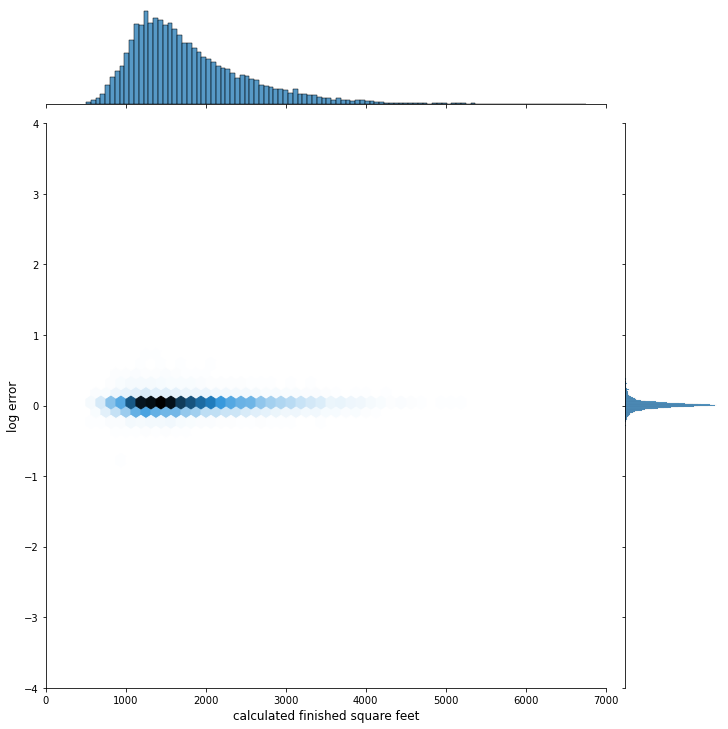

In [38]:
plt.figure(figsize=(4, 6))
sns.jointplot(x = train.total_sqft.values, 
             y = train.logerror.values, size = 10, kind = 'hex')
plt.xlim(0, 7000)
plt.ylim(-4,4)
plt.ylabel('log error', fontsize = 12)
plt.xlabel('calculated finished square feet', fontsize = 12)
plt.show()

Text(0.5, 1.0, 'Logerror by Calculated Finished Square Feet')

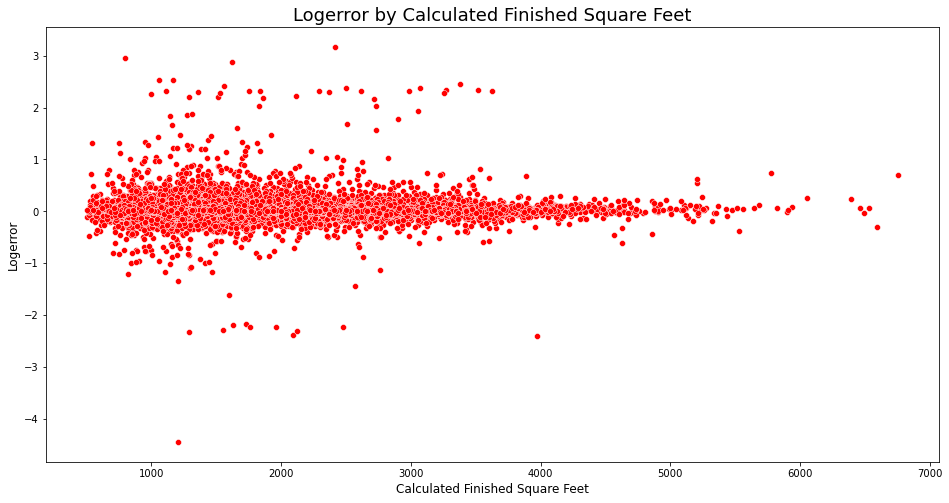

In [39]:
# Visualizing how logerror is correlated with square feet
plt.figure(figsize = (16,8))
sns.scatterplot(x = train.total_sqft, y = train.logerror, color = 'red', data = train)
plt.xlabel('Calculated Finished Square Feet', fontsize = 12)
plt.ylabel('Logerror', fontsize = 12)
plt.title('Logerror by Calculated Finished Square Feet', fontsize = 18)

#### lot_sqft

Text(0.5, 1.0, 'Logerror by Calculated Finished Square Feet')

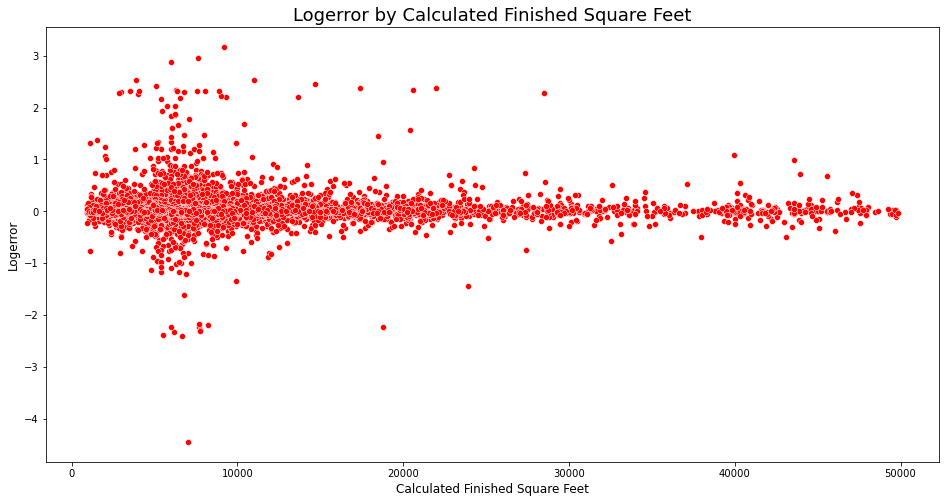

In [40]:
# Visualizing how logerror is correlated with square feet
plt.figure(figsize = (16,8))
sns.scatterplot(x = train.lot_sqft, y = train.logerror, color = 'red', data = train)
plt.xlabel('Calculated Finished Square Feet', fontsize = 12)
plt.ylabel('Logerror', fontsize = 12)
plt.title('Logerror by Calculated Finished Square Feet', fontsize = 18)

## Question 4: Is log error significantly different with different size of bed/bath (num. of bed/bath; small/medium/large)

#### Bedrooms

<AxesSubplot:xlabel='bedrooms', ylabel='logerror'>

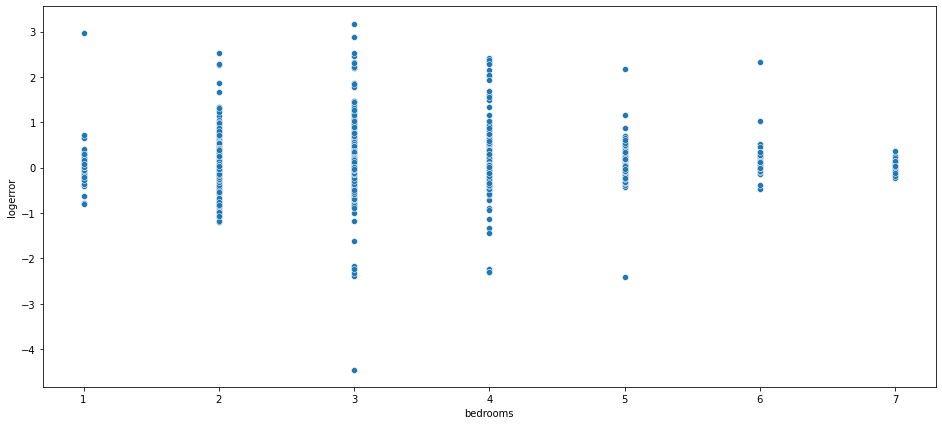

In [41]:
plt.figure(figsize = (16,7))
sns.scatterplot(x='bedrooms', y='logerror', data = train)

#### Bathrooms

<AxesSubplot:xlabel='bathrooms', ylabel='logerror'>

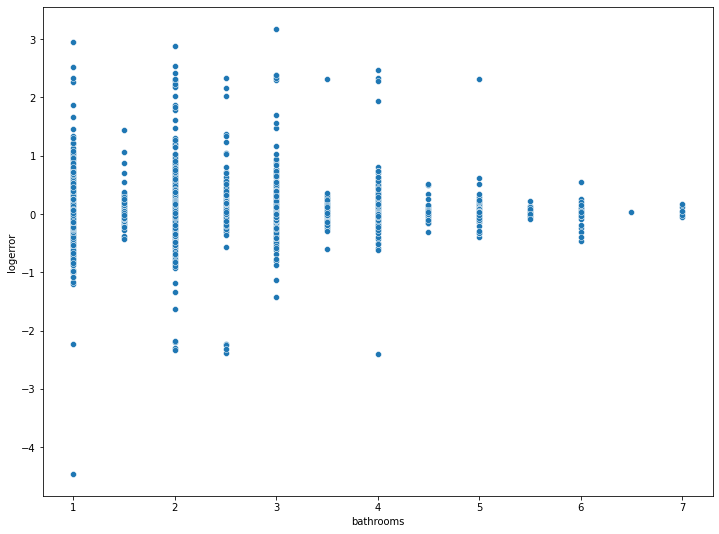

In [42]:
plt.figure(figsize = (12,9))
sns.scatterplot(x='bathrooms', y='logerror', data = train)

#### Fullbath

<AxesSubplot:xlabel='full_bath', ylabel='logerror'>

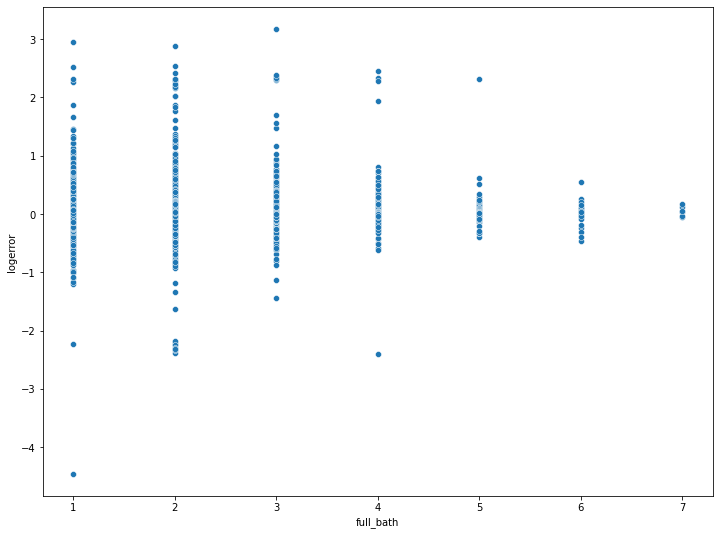

In [43]:
plt.figure(figsize = (12,9))
sns.scatterplot(x='full_bath', y='logerror', data = train)

#### Total Room

<AxesSubplot:xlabel='roomcnt', ylabel='logerror'>

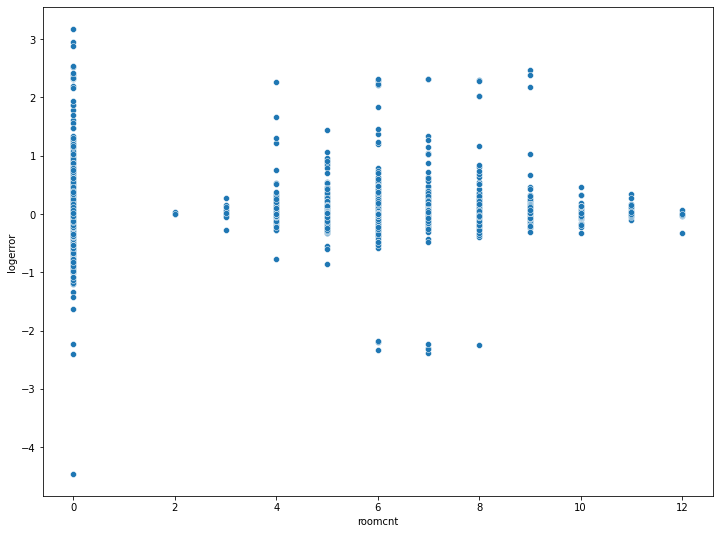

In [44]:
plt.figure(figsize = (12,9))
sns.scatterplot(x='roomcnt', y='logerror', data = train)

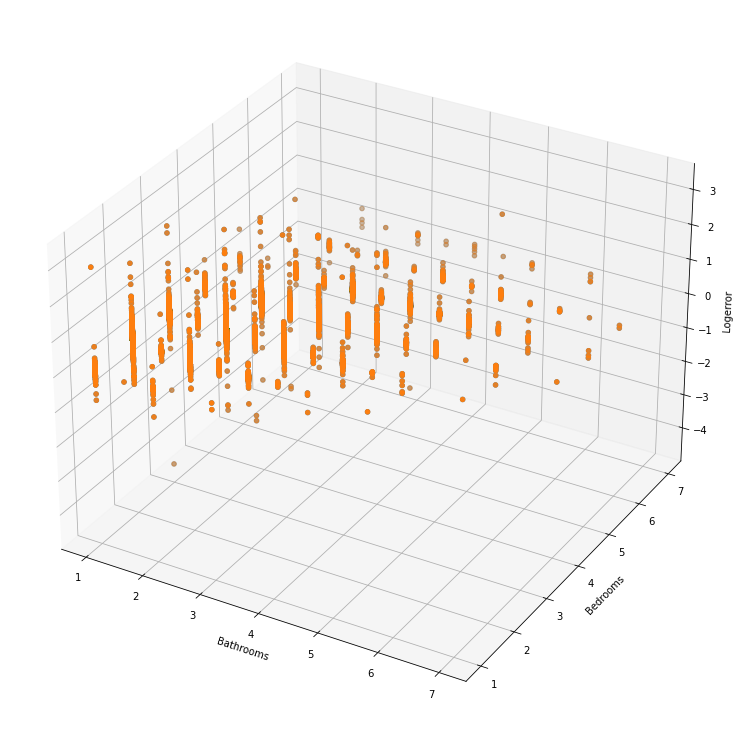

In [45]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure()
fig.set_size_inches(20,10)
ax = Axes3D(fig)

x = train.bathrooms
y = train.bedrooms
z = train.logerror
ax.scatter(x, y, z)
ax.set_xlabel("Bathrooms")
ax.set_ylabel("Bedrooms")
ax.set_zlabel("Logerror")

ax.scatter(x, y, z)

plt.show()

In [46]:
fig = px.scatter_3d(df, x='bedrooms', y='bathrooms', z='logerror',
              color='logerror')
fig.update_layout(width=900, height=700)
# fig.update_layout(margin={"r":0,"t":0,"l":10,"b":0})
fig.show()

## Question 5: Is log error correlated with assessed value, taxamount, structure value, landvalue?

**assessed_value**

<AxesSubplot:xlabel='assessed_value', ylabel='logerror'>

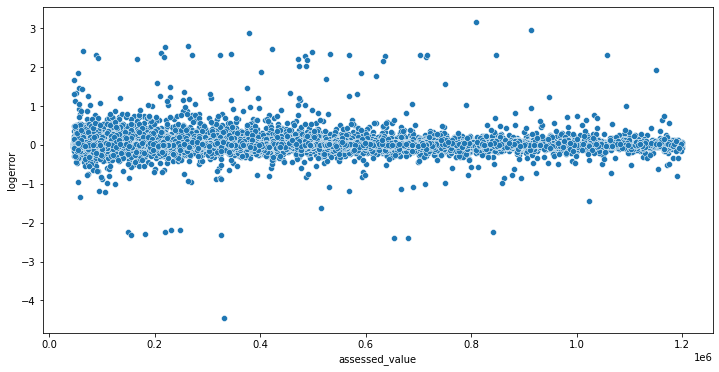

In [49]:
plt.figure(figsize = (12,6))
sns.scatterplot(x='assessed_value', y='logerror', data = train)

**land_value**

<AxesSubplot:xlabel='land_value', ylabel='logerror'>

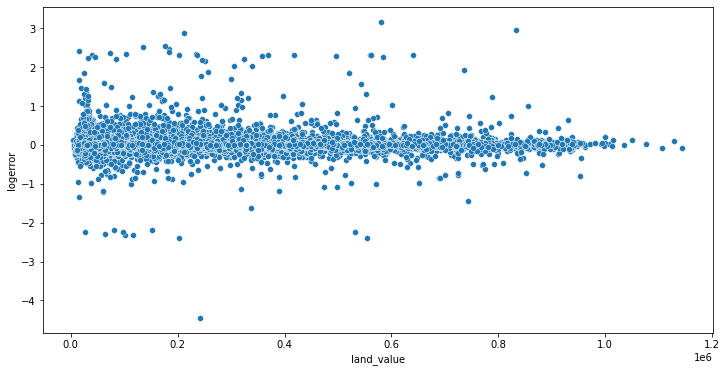

In [50]:
plt.figure(figsize = (12,6))
sns.scatterplot(x='land_value', y='logerror', data = train)

**structure_value**

<AxesSubplot:xlabel='structure_value', ylabel='logerror'>

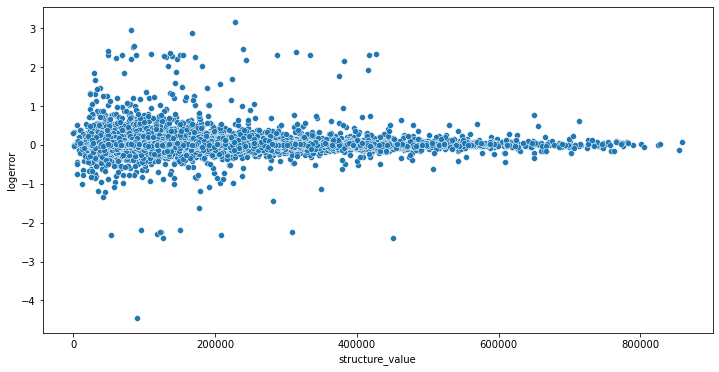

In [51]:
plt.figure(figsize = (12,6))
sns.scatterplot(x='structure_value', y='logerror', data = train)

<AxesSubplot:xlabel='taxamount', ylabel='logerror'>

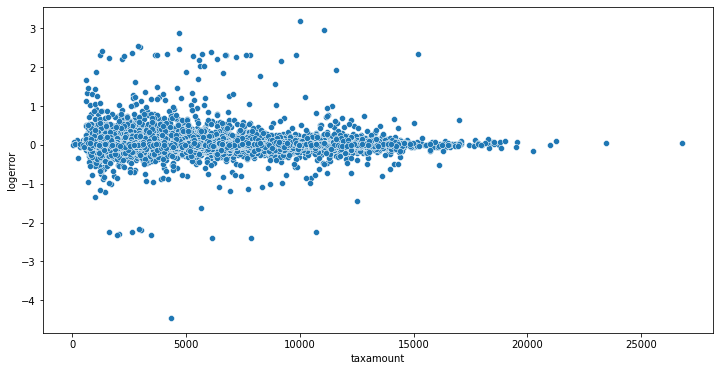

In [52]:
plt.figure(figsize = (12,6))
sns.scatterplot(x='taxamount', y='logerror', data = train)

# Scaling

In [47]:
df.columns

Index(['bathrooms', 'bedrooms', 'total_sqft', 'living_sqft', 'full_bath',
       'latitude', 'longitude', 'lot_sqft', 'roomcnt', 'structure_value',
       'assessed_value', 'land_value', 'taxamount', 'logerror',
       'transactiondate', 'age', 'county', 'county_Los Angeles',
       'county_Orange', 'county_Ventura', 'taxrate'],
      dtype='object')

In [53]:
# Copy a new dataframe to perform feature engineering
scaled_df = df.copy()

# Initiate MinMaxScaler
scaler = MinMaxScaler()

# Fit numerical features to scaler
scaler.fit(scaled_df[['bathrooms', 'bedrooms', 'total_sqft', 'living_sqft', 'full_bath',
       'latitude', 'longitude', 'lot_sqft', 'roomcnt',
       'structure_value', 'assessed_value', 'land_value', 'taxamount', 'age']])

# Set the features to transformed value
scaled_df[['bathrooms', 'bedrooms', 'total_sqft', 'living_sqft', 'full_bath',
       'latitude', 'longitude', 'lot_sqft', 'roomcnt',
       'structure_value', 'assessed_value', 'land_value', 'taxamount', 'age']] = scaler.transform(scaled_df[['bathrooms', 'bedrooms', 'total_sqft', 'living_sqft', 'full_bath',
       'latitude', 'longitude', 'lot_sqft', 'roomcnt',
       'structure_value', 'assessed_value', 'land_value', 'taxamount', 'age']])

# Split the scaled data into train, validate, test
s_train, s_validate, s_test = prepare.split(scaled_df)

# Split each dataset into X, y
cols = ['bathrooms', 'bedrooms', 'total_sqft', 'living_sqft', 'full_bath',
       'latitude', 'longitude', 'lot_sqft', 'roomcnt',
       'structure_value', 'assessed_value', 'land_value', 'taxamount', 'age', 'county_Los Angeles',
       'county_Orange', 'county_Ventura']
X_train = s_train[cols]
y_train = s_train.logerror
X_validate = s_validate[cols]
y_validate = s_validate.logerror
X_test = s_test[cols]
y_test = s_test.logerror

# Clustering

## Location Cluster with latitude, longitude

In [14]:
df.to_csv('graph.csv')